### 赤いロボット（捕食者）を追加する

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
rc("animation", html="jshtml")

In [36]:
def Fr(X, rr):
    fr = np.array([])
    for i in np.arange(len(X)):
        # i番目のロボット
        fr_i = np.array([])
        for j in np.arange(len(X)):
            if i != j: 
                # Xi-Xj
                molecule = X[i] - X[j] 
                # 反発力が働く場合：反発する
                if np.linalg.norm(molecule) < rr:
                    norm = np.linalg.norm(molecule) ** 2
                    molecule_norm = molecule/norm
                # 反発しない場合：近くにロボットがいない
                else:
                    molecule_norm = np.array([0.0, 0.0])
                fr_i = np.append(fr_i, (molecule_norm))
        fr = np.append(fr, fr_i.reshape(len(X)-1,2).sum(0))
    return fr.reshape(len(X),2)

def Fa(X, V, ra):
    fa = np.array([])
    for i in np.arange(len(V)):
        fai = np.array([])
        for j in np.arange(len(V)):
            # 反応半径が1.0未満のとき：速度調整が行われない
            if np.linalg.norm(X[i]-X[j]) < ra:
                Vi = np.array([0,0])
                # Vi = V[j] - V[i]
            # 反応半径にいない場合：群れの外にいる
            else:
                Vi = V[j] - V[i]
                # Vi = np.array([0,0])
            fai = np.append(fai, Vi)
        fa = np.append(fa, fai.reshape(len(V),2).sum(0))        
    return fa.reshape(len(V),2)

def Fh(X):
    fh = np.array([])
    for i in np.arange(len(X)):
        # 他すべての個体における位置の総和/他のロボット数
        Xh = ((X-X[i]).sum(0))/(len(X)-1)
        # Xh - X
        fh = np.append(fh, np.array(Xh - X[i]))
    return fh.reshape(len(V),2)
    
def Ff(V, s=10):
    ff = np.array([])
    for i in np.arange(len(V)):
        ff = np.append(ff, -V[i] * (np.linalg.norm(V[i])-s)/s)
    return ff.reshape(len(V), 2)

def Fp(X, xp, rp):
    fpi = np.array([])
    for i in np.arange(len(X)):
        Xi_Xp = rp - np.linalg.norm(X[i] - xp)
        if Xi_Xp > 0:
            molu_norm_2 = (X[i]-xp) / (np.linalg.norm(X[i]-xp) ** 2)
        else:
            molu_norm_2 = np.array([0.0, 0.0])
        fpi = np.append(fpi, molu_norm_2)
    return fpi.reshape(len(X),2)

def F(X, V, xp, Ka=0.1, Kr=1.0, Kf=0.02, Kh=5, Kp=100, a=200, b=0.1, rr=3.0, ra=3.0, rp=7.0):
    F = Kr*Fr(X, rr) + Ka*Fa(X, V, ra) + Kf*Ff(V) + Kh*Fh(X) + Kp*Fp(X, xp, rp)
    return F #a * np.tanh(b * F)

In [3]:
from scipy.integrate import solve_ivp
def lorenz63(t, arr_xyz, ss, rr, bb):
    # 時刻t-1の値
    x, y, z = arr_xyz
    # Lorenz63モデルのパラメタ
    s, r, b = ss, rr, bb

    # 時刻tの値
    dxdt = -s * (x-y)
    dydt = -x*z + r*x -y
    dzdt = x*y - b*z

    return np.array([dxdt, dydt, dzdt])

def zscore(x, axis = None):
    # 平均値    
    xmean = x.mean(axis=axis, keepdims=True)
    # xp座標(x,y,z)の標準偏差
    xstd  = np.std(x, axis=axis, keepdims=True)
    # 標準化：標準偏差2，平均0
    zscore = (x-xmean)/xstd
    return zscore*2

# --- 常微分方程式計算 --- #
# scipy.integrate.solve_ivpでLorenz63モデルを計算
def solver(xp):
    time = 10
    # solver = solve_ivp(fun=lorenz63, t_span=time_range, y0=xp, method=method, t_eval=time_step, dense_output=dense_output, args=lorent_srb)
    solver = solve_ivp(fun=lorenz63, t_span=(0, time), y0=xp, method='RK45', t_eval=np.arange(0, time, 0.02), dense_output=True, args=(10, 26, 8/3))
    # 変数入れ替え
    xyz = solver.y
    # データの形を変える：3,50 → 50,3，転置
    xyz = (xyz.T)/2
    # z座標だけ標準化
    xyz[2] = zscore(xyz[2])

    return xyz

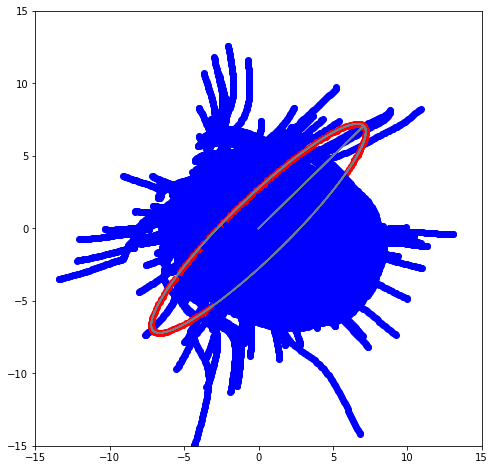

In [41]:
N = 200
X = np.random.randn(N, 2)*5
V = np.random.randn(N, 2)
dt = 0.02

fig = plt.figure(figsize=(8, 8))
ims = []
size = 15
plt.xlim(-size,size)
plt.ylim(-size,size)

# 捕食者の軌跡
xp_xtail = np.zeros(10)
xp_ytail = np.zeros(10)

xp = np.random.rand(3)
xp = solver(xp)

theta = np.arange(0, 721, 2)
# X = np.cos(theta/180*np.pi)
# Y = np.sin(theta/180*np.pi)/3
x = (np.cos(theta/180*np.pi) + np.sin(theta/180*np.pi)/5)/np.sqrt(2)*10
y = (np.cos(theta/180*np.pi) - np.sin(theta/180*np.pi)/5)/np.sqrt(2)*10
xp = np.hstack((x.reshape(len(x),1), y.reshape(len(y),1)))

for t in np.arange(0, 4, dt):
    xp_xtail = np.append(xp[int(t*50)][0], np.delete(xp_xtail, -1))
    xp_ytail = np.append(xp[int(t*50)][1], np.delete(xp_ytail, -1))

    X = X + V * dt
    V = V + F(X, V, xp[int(t*50)][:2]) * dt

    ims.append([plt.scatter(X[:, 0], X[:, 1], c="b"),
                plt.scatter(xp[int(t*50)][0], xp[int(t*50)][1], c="r")]+
                plt.plot(xp_xtail, xp_ytail, c="slategrey"))


In [42]:
ani = animation.ArtistAnimation(fig, ims, interval=50)
ani

In [60]:
ani = animation.ArtistAnimation(fig, ims, interval=50)
ani

In [40]:
ani.save("ver2_boid_3.gif", writer="imagemagick")

MovieWriter imagemagick unavailable; using Pillow instead.


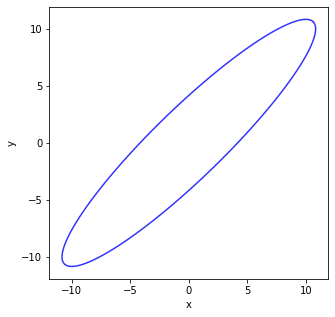

In [29]:
import numpy as np
import matplotlib.pyplot as plt

theta = np.arange(0, 361, 3)
X = np.cos(theta/180*np.pi)
Y = np.sin(theta/180*np.pi)/5
x = (X+Y)/np.sqrt(2)*15
y = (X-Y)/np.sqrt(2)*15
plt.figure(figsize=(5, 5))
#plt.xlim([-1.2, 1.2])
#plt.ylim([-1.2, 1.2])
plt.xlabel('x')
plt.ylabel('y')
plt.plot(x, y, color='blue', alpha=0.8)

In [19]:
print(np.hstack((x.reshape(len(x),1), y.reshape(len(y),1))))

[[ 0.70710678  0.70710678]
 [ 0.72464127  0.68763416]
 [ 0.74018957  0.66627678]
 [ 0.75370906  0.64309319]
 [ 0.76516268  0.61814692]
 [ 0.77451905  0.59150635]
 [ 0.78175252  0.56324451]
 [ 0.78684325  0.53343885]
 [ 0.78977731  0.50217107]
 [ 0.79054664  0.46952687]
 [ 0.78914913  0.43559574]
 [ 0.78558862  0.40047067]
 [ 0.77987487  0.36424793]
 [ 0.77202354  0.32702682]
 [ 0.76205614  0.28890935]
 [ 0.75        0.25      ]
 [ 0.73588816  0.21040542]
 [ 0.71975931  0.17023413]
 [ 0.70165764  0.12959624]
 [ 0.68163278  0.08860313]
 [ 0.65973961  0.04736717]
 [ 0.63603814  0.00600138]
 [ 0.61059333 -0.03538086]
 [ 0.58347493 -0.07666612]
 [ 0.55475727 -0.11774124]
 [ 0.52451905 -0.15849365]
 [ 0.49284317 -0.19881163]
 [ 0.45981643 -0.23858469]
 [ 0.42552937 -0.2777038 ]
 [ 0.39007597 -0.31606175]
 [ 0.35355339 -0.35355339]
 [ 0.31606175 -0.39007597]
 [ 0.2777038  -0.42552937]
 [ 0.23858469 -0.45981643]
 [ 0.19881163 -0.49284317]
 [ 0.15849365 -0.52451905]
 [ 0.11774124 -0.55475727]
 